# Проект: Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

**Цель исследования:**
1. Подготовить исследование рынка Москвы..
2. Найти интересные особенности
3. Презентовать полученные результаты.

**Ход исследования:**
Данные я получу из файла `moscow_places.csv`. О качестве данных ничего не известно. Поэтому перед тем, как приступать к целям исследования, потребуется обзор данных.

Я проверю данные и их типы на ошибки/неточности и оценю их влияние на исследование. Затем, на этапе предобработки, я поищу возможность исправить все ошибки данных, которые не приведут к искажению конечного результата. Далее создам необходимые столбцы и приступлю к проведению анализа.

Таким образом, мое исследование пройдет в 5 этапов:
- Обзор данных
- Предобработка данных
- Изучение и анализ данных
- Детализируем исследование: открытие кофейни
- Подготовка презентации

##  Обзор данных

In [1]:
# Импортируем библиотеки
import pandas as pd
import seaborn as sns
import numpy as np
from datetime import datetime, timedelta
from matplotlib import pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
import scipy.stats as stats
import math as mth
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
data = pd.read_csv('moscow_places.csv')
data.info()
data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


По первому взгляду на данные:
- Представлено 8406 заведений. 
- Есть пропуски в столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.Необходимо проверить какие данные имеют значение для исследования, и также на возможность их заполнить/восстановить.
- Тип данных везде либо object, int64, float64.

##  Предобработка данных

**Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?**

In [3]:
pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Пропуски в avg_bil, middle_coffee_cup и middle_avg_bill оставляем без изменений - заполнение пропусков сильно повлияет на результаты исследования. Плюс слишком мало данных, чтобы можно было заполнить чем-то адекватным, основываясь только на значениях в датасете.
Что касается строк с пропусками в столбце hours - не стоит этого делать, потому что таких данных достаточно много.

Оставляем пропуски как есть

Посмотрим на столбец seats

In [4]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

1288 сидячих мест - очень большое количество даже для Москвы. Построим boxplot и посмотрим на выбросы.

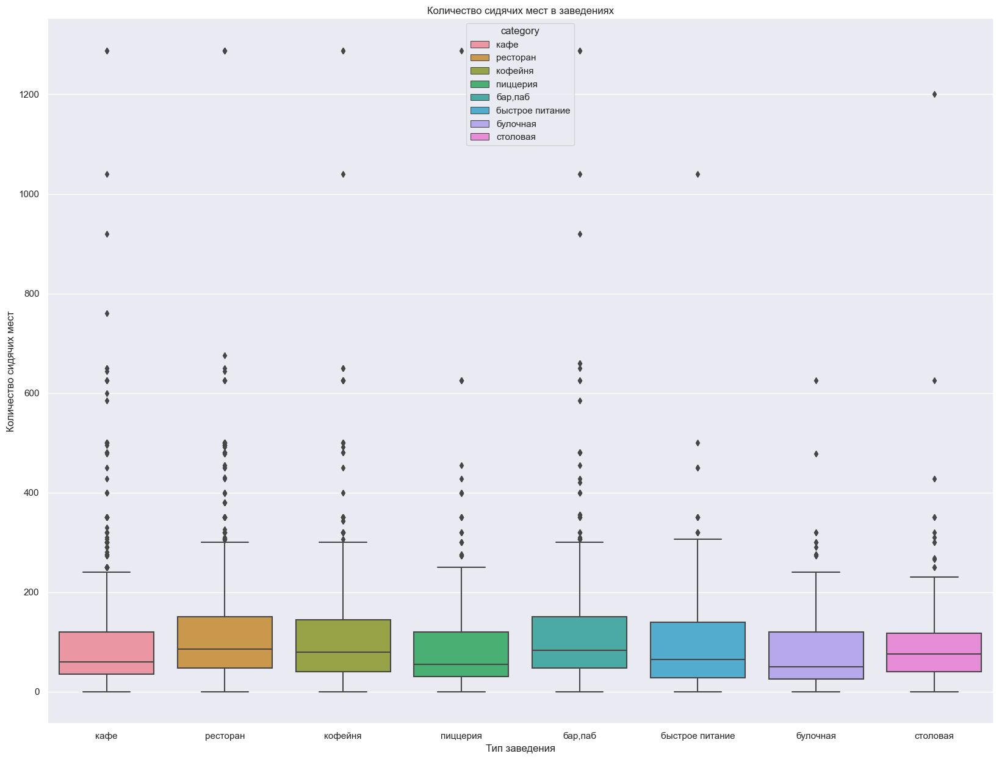

In [5]:
sns.set(rc={'figure.figsize':(20,15)})
sns.set_palette('rocket')
sns.boxplot(y='seats', x='category', data=data, hue="category", dodge=False)
plt.title('Количество сидячих мест в заведениях')
plt.xlabel('Тип заведения')
plt.ylabel('Количество сидячих мест')
plt.show()

На графике есть выбросы. Скорее всего они связаны с ошибкой при заполнении данных. Установим допустимую границу в 600 мест. Остальное отсечем. Посчитаем количество таких заведений и удалим их.

In [6]:
print('Количество заведений с числом мест больше 600:', data[data['seats'] > 600]['name'].count())
data_new = data[data['seats'] > 600]
data = data.query('index not in @data_new.index')
print('Заведений с числом мест больше 600:', data[data['seats'] > 600]['name'].count())

Количество заведений с числом мест больше 600: 53
Заведений с числом мест больше 600: 0


**Изучите, есть ли дубликаты в данных.**

In [7]:
data.duplicated().sum()

0

Неявные дубликаты имеет смысл искать в столбце name в сочетании с address

In [8]:

# приводим столбец к нижнему регистру
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data.head()

C:\Users\zhuk.d\AppData\Local\Temp\ipykernel_5536\3304791970.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['name'] = data['name'].str.lower()
C:\Users\zhuk.d\AppData\Local\Temp\ipykernel_5536\3304791970.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['address'] = data['address'].str.lower()


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [9]:
data.duplicated(subset=['name', 'address']).sum()
print(len(data))
data = data.drop_duplicates(subset=['name', 'address'])
print(len(data))

8353
8349


Удалили неявные дубликаты.

**Создайте столбец street с названиями улиц из столбца с адресом.**

In [10]:
data['street'] = data['address'].str.split(', ').str[1]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


**Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):**

логическое значение True — если заведение работает ежедневно и круглосуточно;

логическое значение False — в противоположном случае

In [11]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


**ВЫВОД:**
- В исходном датасете 8406 строк в таблице, тип данных соответствует значениям, изменять название столбцов не требуется.
- Оставили пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Пропусков в данных большое количество. Просто удалить их нельзя, т.к. будут искажения в исследовании. 
- Удалили неявные дубликаты
- Удалили строки с аномальным количеством заведений с числом мест больше 600

##  Анализ данных

**Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.**

In [12]:
category = data.groupby('category')['name'].count().reset_index()
category.columns = ['category', 'count']
category

,category,count
0,"бар,паб",755
1,булочная,255
2,быстрое питание,602
3,кафе,2364
4,кофейня,1401
5,пиццерия,629
6,ресторан,2030
7,столовая,313


In [13]:
go.Figure(data=[go.Pie(labels=category['category'], values= category['count'])], layout = go.Layout(title=go.layout.Title(text='Круговая диаграмма категорий заведений')))

In [14]:
fig = px.bar(category,
             x='category',
             y='count',
             text = 'count',
             #color = 'count',
             title = 'Количество заведений общественного питания по категориям'
             )
fig.update_layout(xaxis_title = 'Категории заведений',
                  yaxis_title = 'Количество заведений',
                  xaxis={'categoryorder':'total descending'})
fig.show()

По количеству заведений лидируют категории кафе - 2362 и ресторан - 2030. На последнем месте булочная - 255.

Кафе и рестораны составляют больше половины от всех заведений. Кофейни, бары/пабы и пиццерии составляют 1/3 от общего числа заведений. На булочные, столовые и быстрое питание приходится около 14%.

**Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.**

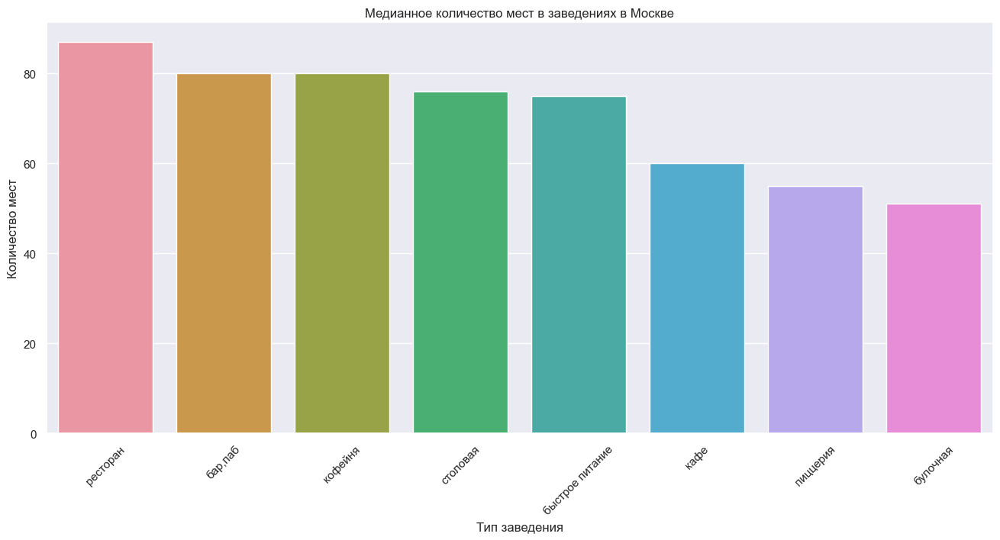

In [15]:
#Считаем по медиане
seats = data[data['seats'] !=0].groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False)

f, ax = plt.subplots(figsize=(16, 7))

ax = sns.barplot(data = seats, x = 'category', y = 'seats')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество мест')
ax.set_title('Медианное количество мест в заведениях в Москве')
plt.xticks(rotation=45)
plt.show()

Больше всего посадочных мест в ресторанах. Далее идут бары, пабы, кофейни, столовые и рестораны быстрого питания. Кафе, булочные и пиццерии располагают для своих гостей меньшим количеством мест.

**Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?**

In [16]:
network = data['chain'].value_counts().reset_index()
network.columns = ['chain', 'count']
network

,chain,count
0,0,5172
1,1,3177


In [17]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=network['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

В Москве заметно больше несетевых заведений - их 62%.

**Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.**

In [18]:
network_type = data.groupby(['category', 'chain'])['name'].count().reset_index()
network_type.columns = ['type', 'chain', 'count']
network_type['chain'] = network_type['chain'].astype(object)
network_type = network_type.sort_values(['count', 'chain'])
network_type

,type,chain,count
15,столовая,1,87
2,булочная,0,99
3,булочная,1,156
1,"бар,паб",1,167
14,столовая,0,226
5,быстрое питание,1,231
10,пиццерия,0,301
11,пиццерия,1,328
4,быстрое питание,0,371
0,"бар,паб",0,588


In [19]:
network_grouped = data[data['chain'] == 1].groupby(['category'])['name'].count()\
                                 .reset_index().sort_values(by='name', ascending=False)
notnetwork_grouped = data[data['chain'] == 0].groupby(['category'])['name'].count()\
                                 .reset_index().sort_values(by='name', ascending=False)

# инициализация фигуры
fig = go.Figure()
# добавление барчарта методом Bar()
fig.add_trace(go.Bar(x=network_grouped.category, y=network_grouped.name,\
                     name='Сетевое', marker={'color': '#E69F00', 'opacity': 0.7}))
fig.add_trace(go.Bar(x=notnetwork_grouped.category, y=notnetwork_grouped.name,\
                     name='Несетевое', marker={'color': '#56B4E9', 'opacity': 0.7}))
# добавление соответствующих подписей и меток
fig.update_layout(title='Соотношение сетевых и несетевых заведений по количеству',\
                  xaxis_title='Категория', yaxis_title='Количество объектов', legend=dict(y=0.95, x=0.84))
fig.update_traces(hoverinfo='all', hovertemplate='Количество объектов: %{y}')
# отображение фигуры
fig.show()

Большинство типов заведений несетевые. Но есть исключения: кофейня, пиццерия, булочная - в этих заведениях сетевые встречаются чаще. 

**Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?**

In [20]:
data_chain = data[data['chain'] == 1]
top_15 = data_chain.groupby('name').agg({'rating': 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,rating,category,count
0,шоколадница,4.20,кофейня,118
1,домино'с пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,70
4,яндекс лавка,4.00,ресторан,68
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,теремок,4.10,ресторан,38


In [21]:
fig = px.bar(top_15,
             x='count',
             y='name',
             text='count',
             color='name',
             height=500,
             width=1000
             )
fig.update_layout(title = 'Топ-15 популярных сетей Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название заведений',
                  showlegend = False)
fig.show()


Cамая популярная сеть - Шоколадница. Далее идут пиццерии. Сеть Му-Му замыкает топ.

In [22]:
fig = px.bar(top_15,
             x='count', 
             y='category',
             color='category',
             text = 'name'
            )

fig.update_layout(title='Количество заведений по категориям из топ-15 популярных сетей Москвы',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название категорий',
                   yaxis={'categoryorder':'total ascending'},
                   width=900,
                   height=500
                 )
fig.show()

По графику наглядно видно, что большая часть приходится на кофейни. У ресторанов, пиццерий и кафе примерно равное количество.

In [23]:
district_chain = data_chain.groupby(['district', 'category', 'name']).agg({'rating' : 'median', 'address' : 'count'})
district_chain = district_chain.sort_values('address', ascending = False).reset_index()
district_chain = district_chain.rename(columns={'address':'count'})
district_chain = district_chain[district_chain['name'].isin(top_15['name'])]
district_chain.head()

,district,category,name,rating,count
0,Центральный административный округ,кофейня,шоколадница,4.20,38
1,Центральный административный округ,ресторан,prime,4.20,36
2,Центральный административный округ,кафе,кулинарная лавка братьев караваевых,4.40,32
3,Центральный административный округ,кофейня,cofix,4.20,20
4,Западный административный округ,кофейня,шоколадница,4.15,16


In [24]:
# шаг 1 выделяем датасет только с популярными заведениями
top15_count = data[data['name'].isin(top_15['name'])].groupby(['district']).agg({'name' : 'count'}).reset_index()
top15_count = top15_count.rename(columns={'name':'count'})
top15_count

,district,count
0,Восточный административный округ,80
1,Западный административный округ,85
2,Северный административный округ,87
3,Северо-Восточный административный округ,85
4,Северо-Западный административный округ,46
5,Центральный административный округ,215
6,Юго-Восточный административный округ,56
7,Юго-Западный административный округ,70
8,Южный административный округ,89


In [25]:
# шаг 2 считаем общее количество заведений по округам
district_count = data.groupby(['district']).agg({'name' : 'count'})
district_count = district_count.sort_values('name', ascending = False).reset_index()
district_count = district_count.rename(columns={'name':'total'})
district_count.head(15)

,district,total
0,Центральный административный округ,2242
1,Южный административный округ,891
2,Северо-Восточный административный округ,890
3,Северный административный округ,875
4,Западный административный округ,830
5,Восточный административный округ,791
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,707
8,Северо-Западный административный округ,409


In [26]:
# объединяем в одну таблицу
district_merge = top15_count.merge(district_count, how='left', on='district')
district_merge['percent'] = round(district_merge['count']/district_merge['total']*100, 2)
district_merge = district_merge.sort_values('percent', ascending=False)
district_merge

,district,count,total,percent
4,Северо-Западный административный округ,46,409,11.25
1,Западный административный округ,85,830,10.24
0,Восточный административный округ,80,791,10.11
8,Южный административный округ,89,891,9.99
2,Северный административный округ,87,875,9.94
7,Юго-Западный административный округ,70,707,9.90
5,Центральный административный округ,215,2242,9.59
3,Северо-Восточный административный округ,85,890,9.55
6,Юго-Восточный административный округ,56,714,7.84


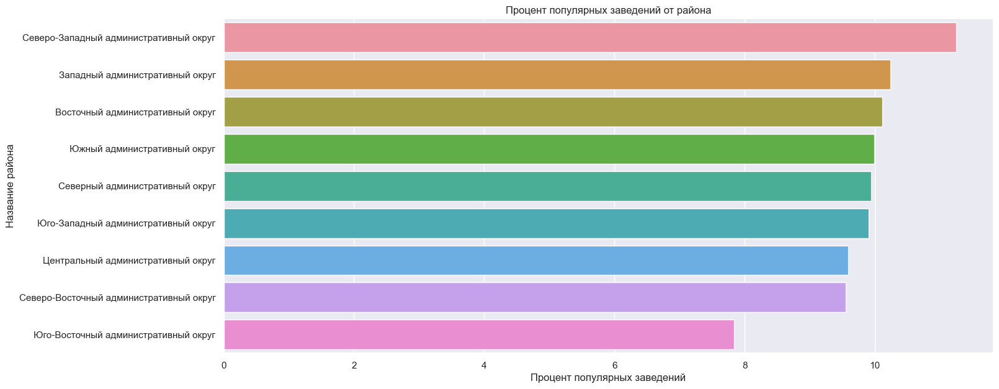

In [27]:
f, ax = plt.subplots(figsize=(16, 7))

ax = sns.barplot(data=district_merge, y="district", x="percent")

ax.set_xlabel('Процент популярных заведений')
ax.set_ylabel('Название района')
ax.set_title('Процент популярных заведений от района')
#plt.xticks(rotation=45)
plt.show()

Из топ-15 больше всего заведений находятся в Северо-Западном админинстративном округе. Примерно одинаковые показатели у Южного, Северного, Восточного и Западного админинстративных округов. Меньше всего заведений из топ-15 в Юго-Восточном админинстративном округе.

**Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [28]:
print('Общее количество заведений в датасете:', data['name'].count())

Общее количество заведений в датасете: 8349


In [29]:
district_chain_data = data.groupby(['district', 'category']).agg({'rating': 'median', 'name': 'count'})
district_chain_data = district_chain_data.sort_values('rating', ascending=False).reset_index()
district_chain_data = district_chain_data.rename(columns={'name': 'count'})
district_chain_data.head()

,district,category,rating,count
0,Центральный административный округ,"бар,паб",4.50,364
1,Западный административный округ,"бар,паб",4.45,46
2,Северо-Западный административный округ,"бар,паб",4.40,23
3,Северный административный округ,"бар,паб",4.40,66
4,Центральный административный округ,ресторан,4.40,670


In [30]:
fig = px.bar(district_chain_data,
             x='count',
             y='district',
             color='category'
            )
fig.update_layout(title = 'Количество заведений каждой категории по районам Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название района',
                  yaxis={'categoryorder': 'total ascending'}
)
fig.show()

Количество районов - 9. По графику видно, что больше всего заведений располагается в Центральном административном округе. В нем преобладают кафе, кофейни и рестораны. Кафе распределены равномерно по всем округам. Столовых меньше всего по всем округам.

**Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?**

In [31]:
category_rating = data.groupby('category').agg({'rating': 'mean'}).round(2).sort_values('rating', ascending=False).reset_index()
category_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [32]:
fig = px.bar(category_rating,
             x='rating',
             y='category',
             text='rating',
             color='category'
            )
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Рейтинг',
                  yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.5])
fig.show()

У категорий бар/паб наивысший рейтинг 4.39. У пиццерий, ресторанов, кофеин и булочных примерно одинаковый рейтинг. Самый маленький рейтинг у ресторанов быстрого питания. 

**Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).**

In [33]:
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [35]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаем карту Мск
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# вывод карты
m

По данным видно, что самый высокий рейтинг в заведениях в Центральном админинстративном округе - 4.38. Самый низкий - в Юго-Восточном админинстратвном округе - 4.1.

**Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium**

In [36]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Основная масса заведений располагаются в центре Москвы.

**Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [37]:
streets = data[data['street'].notnull()]
top15_streets = streets['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street', 'count']
top15_streets

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,ленинский проспект,107
3,проспект вернадского,97
4,дмитровское шоссе,88
5,каширское шоссе,77
6,варшавское шоссе,76
7,ленинградский проспект,72
8,ленинградское шоссе,70
9,мкад,65


In [38]:
# таблица со столбцами - улица - категоория - количество

streets_category = data.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street', 'category', 'count']
streets_category.sort_values('count', ascending=False)

,street,category,count
2136,проспект мира,кафе,53
2139,проспект мира,ресторан,45
1519,мкад,кафе,45
2137,проспект мира,кофейня,36
2148,профсоюзная улица,кафе,35
...,...,...,...
1535,молодёжная улица,кофейня,1
1537,монтажная улица,кофейня,1
1538,монтажная улица,ресторан,1
1539,москворецкая набережная,кофейня,1


In [39]:
# улицы из топ15

streets_top15_category = streets_category[streets_category['street'].isin(top15_streets['street'])]
streets_top15_category

,street,category,count
320,алтуфьевское шоссе,"бар,паб",5
321,алтуфьевское шоссе,булочная,1
322,алтуфьевское шоссе,быстрое питание,5
323,алтуфьевское шоссе,кафе,13
324,алтуфьевское шоссе,кофейня,9
...,...,...,...
2794,улица вавилова,быстрое питание,11
2795,улица вавилова,кафе,15
2796,улица вавилова,кофейня,10
2797,улица вавилова,пиццерия,3


In [40]:
fig = px.bar(streets_top15_category, 
             x='count', 
             y='street',                    
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

Больше всего заведений на проспекте Мира. Преобладают кафе и рестораны. Далее идет Профсоюзная улица. По заведениям ситуация схожая.

**Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?**

In [41]:
streets_with_one_cafe = data['street'].value_counts().reset_index()
streets_with_one_cafe.columns = ['street', 'count_cafe']
streets_with_one_cafe = streets_with_one_cafe[streets_with_one_cafe['count_cafe']==1]
streets_with_one_cafe

,street,count_cafe
990,парк дружбы,1
991,улица ремизова,1
992,2-й рощинский проезд,1
993,улица губкина,1
994,андреевский пешеходный мост,1
...,...,...
1442,малый казённый переулок,1
1443,улица маршала соколовского,1
1444,улица максимова,1
1445,басманный тупик,1


In [42]:
streets_category_new = streets_category[streets_category['street'].isin(streets_with_one_cafe['street'])]
streets_category_new = streets_category_new.groupby('category')['street'].count().sort_values(ascending=False)
streets_category_new.columns = ['category', 'count_cafe']
streets_category_new

category
кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: street, dtype: int64

 457 улиц имеют только одно заведение. Больше всего - это кафе (159)

**Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?**

In [43]:
median_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [44]:
# создаем карту Москвы

mm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=state_geo,
    data = median_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    legend_name = 'Средний чек заведений по районам',
).add_to(mm)

mm

По данным выше мы видим, что самый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе. Из таблицы выше видно, что средний чек округов вокруг центрального в среднем отличается в 1,5 - 2 раза

**ВЫВОД**
Был проведен анализ заведений общественного питания Москвы:

- По количеству заведений лидируют кафе с количеством 2364(28.3%), чуть меньше рестораны - 2031(24.3%). Категория булочные на последнем месте - 255(3.05%).

- Больше всего посадочных мест предоставляют рестораны. Далее идут заведения быстрого питания, т.к они больше всего распространены в Москве. Для кафе и столовых посадочных мест меньше всего.

- В Москве 61.9% мест являются несетевыми.

- Самая популярная сеть в Москве - Шоколадница. На втором и третьем месте расположились известные пиццерии.

- Всего заведений в топ-15 - 811. По графику наглядно видно, что большая часть приходится на кофейни. У ресторанов, пиццерий и кафе примерно равное количество.

- Количество районов - 9. Больше всего заведений располагается в Центральном админинстративном округе. В нем преобладают кафе, кофейни и рестораны. Кафе распределены равномерно по всем округам. Столовых меньше всего по всем округам.

- У категорий бар/паб наивысший рейтинг 4.39. Самый маленький рейтинг у ресторанов быстрого питания. 

- Самый высокий рейтинг в заведениях в Центральном админинстративном округе - 4.38. Самый низкий - в Юго-Восточном админинстратвном округе - 4.1.

- Основная масса заведений располагаются в центре Москвы.

- Больше всего заведений на проспекте Мира. Преобладают кафе и рестораны. Далее идет Профсоюзная улица. 

- 457 улиц имеют только одно заведение. Больше всего - это кафе (159).

- Самый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе. 

## Детализируем исследование: открытие кофейни

**Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?**

In [45]:
coffee_data = data[data['category'] == 'кофейня']
print('Количество кофеин:', len(coffee_data))

Количество кофеин: 1401


In [46]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
mmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(mmm)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_data.apply(create_clusters, axis=1)

# выводим карту
mmm

Всего 1401 заведение в категории кофейня. Большая часть заведений располагается в Центральном районе. Меньше всего заведений - в восточной и южной частях города.

**Есть ли круглосуточные кофейни?**

In [47]:
coffee_24_7 = coffee_data[coffee_data['is_24/7'] == True]
print('Количество круглосуточных кофеен:', len(coffee_24_7))

Количество круглосуточных кофеен: 59


In [48]:


# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
mmmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(mmmm)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_24_7.apply(create_clusters, axis=1)

# выводим карту
mmmm

Количество круглосуточных кофеен - 59. Большинство также находятся в центре города. Этого следовало ожидать, т.к. в центре ночью гуляют большинство людей. В спальных районах это не распространено.

**Какие у кофеен рейтинги? Как они распределяются по районам?**

In [49]:
coffee_rating = coffee_data.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [50]:
# создаём карту
mmmmm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по районам',
).add_to(mmmmm)

# выводим карту
mmmmm

Самый высокий рейтинг в округах: Центральный административный округ и Северо-Западный административный округ. Самый низкий рейтинг у Западного административного округа.

**На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**

In [51]:
cup_of_coffee = coffee_data.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(cup_of_coffee)
coffee_price = round(cup_of_coffee['middle_coffee_cup'].mean(), 2)
print(f'Средняя стоимость чашки кофе в Москве:', coffee_price)

,district,middle_coffee_cup
1,Западный административный округ,188.56
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,166.34
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Средняя стоимость чашки кофе в Москве: 171.23


In [52]:
m_6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_of_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    legend_name='Средняя цена чашки кофе по районам',
).add_to(m_6)

# выводим карту
m_6

Самый дорогой кофе в Западном(188.56) и Центральном округах(187.52). Средняя стоимость чашки кофе для Москвы - 171.23.

**Рекомендации:**

- При открытии кофейни стоит рассмотреть следующие районы: Центральный, Западный и Юго-Западный, Восточный, т.к. в этих районах высокая стоимость чашки кофе выше среднего по городу. Это позволит сделать выгодные акции и скидки на этапе открытия без потери в издержках. 

- Также на на Западном и Юго-Западном направлении круглосуточных точек мало. Можно попробовать открыть круглосуточное заведение, т.к. кокуренции мало

- Западный район привлекателен для открытия тем, что в нем самый низкий средний рейтинг у кофеин, что может стать преимуществом при высоком сервисе и вкусном кофе новой кофейни. Мы можем зарекомендовать себя, среди конкурентов с более низким рейтингом.

## Презентация

https://disk.yandex.ru/d/mXUKnYqZ_8TMeQ